Bài tập thực hành 3 (Bổ sung): Phân đoạn hình ảnh bằng K-Means (K-Means Image Segmentation)
Bài toán: Phân đoạn một hình ảnh cho trước thành K cụm bằng thuật toán K-means.



tải ảnh bằng pil

In [1]:
#import thư viện PIL để đọc và xử lý ảnh
from PIL import Image

# Đọc ảnh từ file
image = Image.open("chua.png")
#chuyển anh sang định dạng RGB
image = image.convert("RGB")
print(image.size)

(1170, 585)


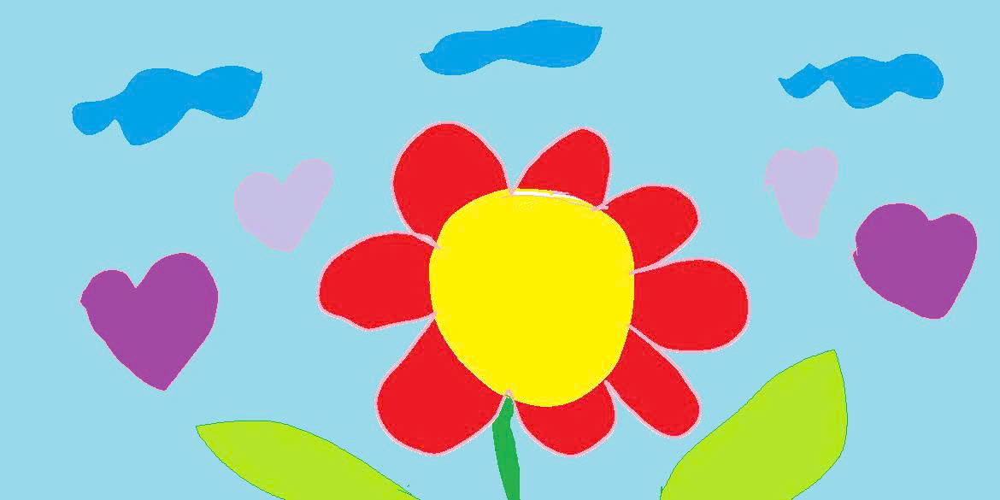

In [2]:
#xuất ảnh ra để kiểm tra bằng PIL

display(image)

In [3]:
from PIL import Image, ImageOps

def resize_with_padding(img, target_size=(224, 224), color=(0, 0, 0)):
    target_w, target_h = target_size

    w, h = img.size

    scale = min(target_w / w, target_h / h)

    new_w = int(w * scale)
    new_h = int(h * scale)

    img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)

    return img

In [4]:
img = resize_with_padding(image)

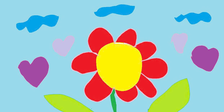

In [5]:
display(img)

In [6]:
import numpy as np
pixels = np.array(img)
print(pixels.shape)

(112, 224, 3)


In [7]:
pixels = pixels.reshape(-1,3)

print("Shape sau flatten:")
print(pixels.shape)

print("\n10 pixel đầu tiên:")
print(pixels[:10])

Shape sau flatten:
(25088, 3)

10 pixel đầu tiên:
[[152 217 235]
 [152 217 235]
 [152 217 235]
 [152 217 235]
 [152 217 235]
 [152 217 235]
 [152 217 235]
 [152 217 235]
 [152 217 235]
 [152 217 235]]


In [ ]:
import numpy as np
from PIL import Image


class KMeansImage:

    def __init__(self, k=4, max_iter=20, tol=1e-3):
        self.k = k
        self.max_iter = max_iter
        self.tol = tol

        self.centroids = None
        self.labels = None

    # ==========================================
    # Khởi tạo centroid ngẫu nhiên
    # ==========================================
    def initialize_centroids(self, pixels):

        indices = np.random.choice(
            len(pixels),
            self.k,
            replace=False
        )

        self.centroids = pixels[indices].astype(float)

        print("\nINITIAL CENTROIDS")
        print("-" * 50)

        for i, c in enumerate(self.centroids):
            print(f"C{i}: {c}")

    # ==========================================
    # Gán pixel vào centroid gần nhất
    # ==========================================
    def assign_clusters(self, pixels):

        distances = np.linalg.norm(
            pixels[:, np.newaxis] - self.centroids,
            axis=2
        )

        labels = np.argmin(distances, axis=1)

        return labels

    # ==========================================
    # Tính centroid mới
    # ==========================================
    def update_centroids(self, pixels, labels):

        new_centroids = []

        for k in range(self.k):

            cluster_pixels = pixels[labels == k]

            if len(cluster_pixels) == 0:

                centroid = self.centroids[k]

            else:

                centroid = cluster_pixels.mean(axis=0)

            new_centroids.append(centroid)

        return np.array(new_centroids)

    # ==========================================
    # Huấn luyện
    # ==========================================
    def fit(self, pixels, watch_pixel=None):

        self.initialize_centroids(pixels)

        for iteration in range(self.max_iter):

            print("\n")
            print("=" * 60)
            print(f"ITERATION {iteration + 1}")
            print("=" * 60)

            old_centroids = self.centroids.copy()

            # -----------------------------
            # Assign Cluster
            # -----------------------------
            labels = self.assign_clusters(pixels)

            self.labels = labels

            print("\nPIXELS PER CLUSTER")

            for k in range(self.k):

                count = np.sum(labels == k)

                print(
                    f"Cluster {k}: {count} pixels"
                )

            # -----------------------------
            # Theo dõi 1 pixel
            # -----------------------------
            if watch_pixel is not None:

                pixel_value = pixels[watch_pixel]

                cluster_id = labels[watch_pixel]

                print("\nWATCH PIXEL")

                print(
                    f"Index : {watch_pixel}"
                )

                print(
                    f"RGB   : {pixel_value}"
                )

                print(
                    f"Cluster Assigned : {cluster_id}"
                )

            # -----------------------------
            # Update Centroid
            # -----------------------------
            self.centroids = self.update_centroids(
                pixels,
                labels
            )

            print("\nCENTROID UPDATE")

            for i in range(self.k):

                print("\nCluster", i)

                print(
                    "Old:",
                    np.round(old_centroids[i], 2)
                )

                print(
                    "New:",
                    np.round(self.centroids[i], 2)
                )

            # -----------------------------
            # Kiểm tra hội tụ
            # -----------------------------
            shift = np.linalg.norm(
                self.centroids - old_centroids
            )

            print(
                f"\nCentroid Shift = {shift:.6f}"
            )

            if shift < self.tol:

                print("\nKMEANS CONVERGED")
                break

        return self
        # ==========================================
    # WCSS (Elbow)
    # ==========================================
    def inertia(self, pixels):

        total = 0

        for k in range(self.k):

            cluster = pixels[self.labels == k]

            if len(cluster) == 0:
                continue

            diff = cluster - self.centroids[k]

            total += np.sum(diff * diff)

        return total
    # ==========================================
    # Davies-Bouldin Index (DBI)
    # ==========================================
    def davies_bouldin_index(self, pixels):

        # Si: khoảng cách trung bình từ các điểm
        # trong cụm tới centroid
        S = np.zeros(self.k)

        for k in range(self.k):

            cluster = pixels[self.labels == k]

            if len(cluster) == 0:
                continue

            S[k] = np.mean(
                np.linalg.norm(
                    cluster - self.centroids[k],
                    axis=1
                )
            )

        # Rij
        R = np.zeros((self.k, self.k))

        for i in range(self.k):

            for j in range(self.k):

                if i == j:
                    continue

                Mij = np.linalg.norm(
                    self.centroids[i] - self.centroids[j]
                )

                if Mij == 0:
                    R[i][j] = 0
                else:
                    R[i][j] = (S[i] + S[j]) / Mij

        # Di = max(Rij)
        D = np.max(R, axis=1)

        # DBI
        return np.mean(D)
    # ==========================================
    # Nén ảnh
    # ==========================================
    def compress(self, pixels):

        labels = self.assign_clusters(pixels)

        compressed_pixels = (
            self.centroids[labels]
            .astype(np.uint8)
        )

        return compressed_pixels




In [9]:
image_path = "f95aed8502aa31e208630a20b28c808c.jpg"

img = Image.open(image_path).convert("RGB")

# resize ảnh
img = resize_with_padding(img)

img_array = np.array(img)

h, w, c = img_array.shape

print("Image Shape:", img_array.shape)

# flatten
pixels = img_array.reshape(-1, 3)

print("Pixels Shape:", pixels.shape)

Image Shape: (168, 224, 3)
Pixels Shape: (37632, 3)


**Tìm K**

In [22]:
Ks = range(2,31)

wcss_list = []
dbi_list = []

for k in Ks:

    print(f"Testing K = {k}")

    temp_model = KMeansImage(
        k=k,
        max_iter=200
    )

    temp_model.fit(pixels)

    wcss = temp_model.inertia(pixels)
    dbi = temp_model.davies_bouldin_index(
        pixels
    )

    wcss_list.append(wcss)
    dbi_list.append(dbi)

    print("WCSS =", wcss)
    print("DBI =", dbi)

Testing K = 2

INITIAL CENTROIDS
--------------------------------------------------
C0: [205. 211. 137.]
C1: [30. 28. 13.]


ITERATION 1

PIXELS PER CLUSTER
Cluster 0: 10229 pixels
Cluster 1: 27403 pixels

CENTROID UPDATE

Cluster 0
Old: [205. 211. 137.]
New: [194.83 179.76  98.59]

Cluster 1
Old: [30. 28. 13.]
New: [44.46 37.08 15.19]

Centroid Shift = 53.399841


ITERATION 2

PIXELS PER CLUSTER
Cluster 0: 11050 pixels
Cluster 1: 26582 pixels

CENTROID UPDATE

Cluster 0
Old: [194.83 179.76  98.59]
New: [190.19 174.71  94.86]

Cluster 1
Old: [44.46 37.08 15.19]
New: [41.75 34.78 14.16]

Centroid Shift = 8.638760


ITERATION 3

PIXELS PER CLUSTER
Cluster 0: 11360 pixels
Cluster 1: 26272 pixels

CENTROID UPDATE

Cluster 0
Old: [190.19 174.71  94.86]
New: [188.38 172.85  93.51]

Cluster 1
Old: [41.75 34.78 14.16]
New: [40.78 33.93 13.79]

Centroid Shift = 3.222000


ITERATION 4

PIXELS PER CLUSTER
Cluster 0: 11473 pixels
Cluster 1: 26159 pixels

CENTROID UPDATE

Cluster 0
Old: [188.38 172

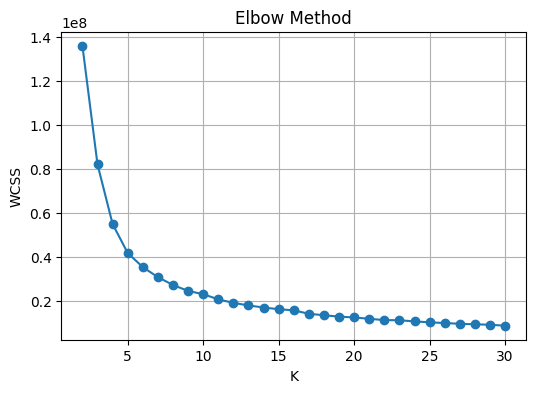

In [23]:
import matplotlib.pyplot as plt
plt.figure(figsize=(6,4))
plt.plot(Ks, wcss_list, marker='o')
plt.title("Elbow Method")
plt.xlabel("K")
plt.ylabel("WCSS")
plt.grid()
plt.show()

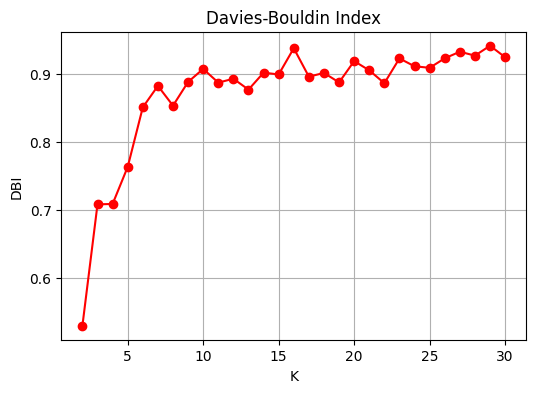

Best K = 2


In [24]:
plt.figure(figsize=(6,4))

plt.plot(
    Ks,
    dbi_list,
    marker='o',
    color='red'
)

plt.title("Davies-Bouldin Index")
plt.xlabel("K")
plt.ylabel("DBI")

plt.grid()

plt.show()

best_k = Ks[np.argmin(dbi_list)]

print("Best K =", best_k)

In [13]:
# ====================================================
# MAIN
# ====================================================

image_path = "f95aed8502aa31e208630a20b28c808c.jpg"

img = Image.open(image_path).convert("RGB")

# resize ảnh
img = resize_with_padding(img)

img_array = np.array(img)

h, w, c = img_array.shape

print("Image Shape:", img_array.shape)

# flatten
pixels = img_array.reshape(-1, 3)

print("Pixels Shape:", pixels.shape)

# nhập K
K = int(input("Nhap so cum K: "))

model = KMeansImage(
    k=K,
    max_iter=200
)

# theo dõi pixel thứ 500
model.fit(
    pixels,
    watch_pixel=500
)
# Metric 1
wcss = model.inertia(pixels)
print("WCSS =", wcss)

print("DBI =", model.davies_bouldin_index(pixels))

compressed_pixels = model.compress(
    pixels
)

compressed_img = compressed_pixels.reshape(
    h,
    w,
    3
)

compressed_img = Image.fromarray(
    compressed_img
)

compressed_img.save(
    "compressed.jpg"
)

print("\nSaved: compressed.jpg")

Image Shape: (168, 224, 3)
Pixels Shape: (37632, 3)

INITIAL CENTROIDS
--------------------------------------------------
C0: [131. 143.  99.]
C1: [238. 230.  89.]
C2: [5. 5. 4.]
C3: [48. 53. 40.]
C4: [203. 164.   4.]
C5: [ 8. 10.  1.]
C6: [84. 69. 23.]
C7: [2. 2. 2.]
C8: [4. 4. 2.]
C9: [30. 33. 13.]
C10: [237. 220.  61.]
C11: [3. 3. 3.]
C12: [ 95. 106.  42.]
C13: [27. 10.  5.]
C14: [162. 122.  49.]
C15: [76. 73.  4.]
C16: [238. 234. 198.]
C17: [177. 189. 140.]
C18: [70. 45. 32.]
C19: [196. 176.  99.]
C20: [3. 3. 3.]
C21: [172. 129.  53.]
C22: [50. 55.  5.]
C23: [56. 53. 11.]
C24: [ 9. 10.  4.]
C25: [60. 66. 31.]
C26: [3. 3. 1.]
C27: [110.  96.  61.]
C28: [160. 153.  99.]
C29: [187. 145.  34.]


ITERATION 1

PIXELS PER CLUSTER
Cluster 0: 736 pixels
Cluster 1: 802 pixels
Cluster 2: 2131 pixels
Cluster 3: 963 pixels
Cluster 4: 392 pixels
Cluster 5: 422 pixels
Cluster 6: 1846 pixels
Cluster 7: 786 pixels
Cluster 8: 277 pixels
Cluster 9: 4840 pixels
Cluster 10: 732 pixels
Cluster 11: 973 p

In [14]:
print("\nFINAL CENTROIDS")

for i, c in enumerate(model.centroids):

    print(
        f"C{i}: {np.round(c,2)}"
    )


FINAL CENTROIDS
C0: [120.4  132.63  91.12]
C1: [225.97 225.52 194.69]
C2: [26.91 23.3  10.41]
C3: [67.87 83.29 81.16]
C4: [222.44 196.83  42.34]
C5: [92.26 28.94 10.88]
C6: [152.27 128.08  37.99]
C7: [5.28 5.06 3.58]
C8: [34.95 39.02 32.57]
C9: [49.57 57.19 53.81]
C10: [236.31 226.61 142.34]
C11: [40.55 35.59 10.38]
C12: [171.97 149.64  62.13]
C13: [151.38  43.72  24.91]
C14: [199.39 177.52  78.7 ]
C15: [124.26 101.17  27.05]
C16: [247.57 247.61 236.16]
C17: [136.89 175.16 167.37]
C18: [172.77  96.65  56.09]
C19: [201.2  195.81 135.73]
C20: [14.32 12.81  6.72]
C21: [229.52 213.21  93.02]
C22: [72.16 64.94 17.54]
C23: [97.89 79.05 16.96]
C24: [55.96 51.45 11.32]
C25: [88.6  85.65 41.31]
C26: [56.92 21.55  6.59]
C27: [112.22 111.9   61.15]
C28: [163.61 163.3  106.17]
C29: [191.96 154.43  33.79]


In [15]:
original_colors = len(
    np.unique(pixels, axis=0)
)

compressed_colors = len(
    np.unique(
        compressed_pixels,
        axis=0
    )
)

print(
    "Original colors:",
    original_colors
)

print(
    "Compressed colors:",
    compressed_colors
)

Original colors: 27975
Compressed colors: 30


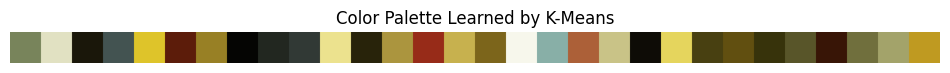

In [21]:
import matplotlib.pyplot as plt
import numpy as np

centroids = np.array(model.centroids)

palette = np.zeros((50, len(centroids) * 50, 3),
                   dtype=np.uint8)

for i, color in enumerate(centroids):

    palette[:, i*50:(i+1)*50] = color

plt.figure(figsize=(12,2))
plt.imshow(palette)
plt.axis("off")
plt.title("Color Palette Learned by K-Means")
plt.show()

In [17]:
unique_labels = np.unique(model.labels)

print(unique_labels)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]


In [18]:
for k in range(K):

    count = np.sum(model.labels == k)

    print(k, count)

0 709
1 1091
2 3623
3 343
4 814
5 564
6 1025
7 5656
8 774
9 555
10 626
11 2405
12 1015
13 255
14 994
15 1042
16 477
17 230
18 350
19 707
20 3897
21 833
22 1826
23 1032
24 2276
25 948
26 1098
27 820
28 543
29 1104


In [19]:
dominant = np.argmax([
    np.sum(model.labels == k)
    for k in range(K)
])

print(
    "Dominant Color:",
    model.centroids[dominant]
)

Dominant Color: [5.28076379 5.05604668 3.57708628]


K=2

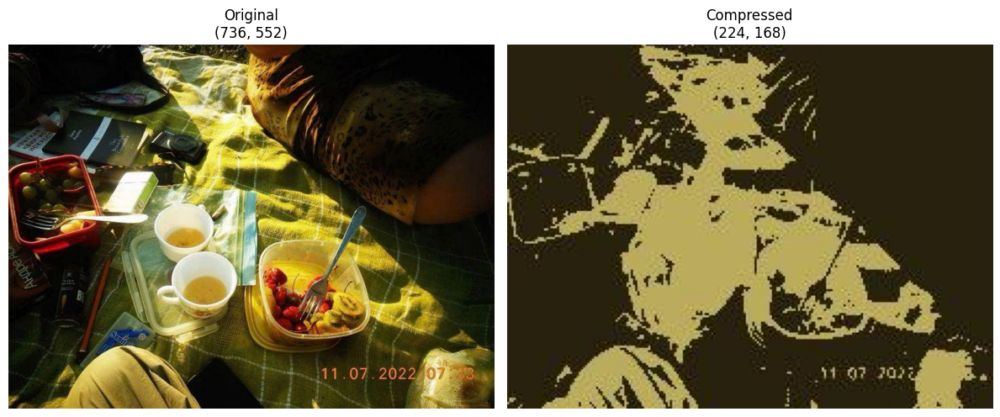

In [58]:
import matplotlib.pyplot as plt
from PIL import Image

# Ảnh gốc
img_original = Image.open("f95aed8502aa31e208630a20b28c808c.jpg")

# Ảnh nén
img_compressed = Image.open("compressed.jpg")

plt.figure(figsize=(12, 6))

# Ảnh gốc
plt.subplot(1, 2, 1)
plt.imshow(img_original)
plt.title(f"Original\n{img_original.size}")
plt.axis("off")

# Ảnh nén
plt.subplot(1, 2, 2)
plt.imshow(img_compressed)
plt.title(f"Compressed\n{img_compressed.size}")
plt.axis("off")

plt.tight_layout()
plt.show()

k=4

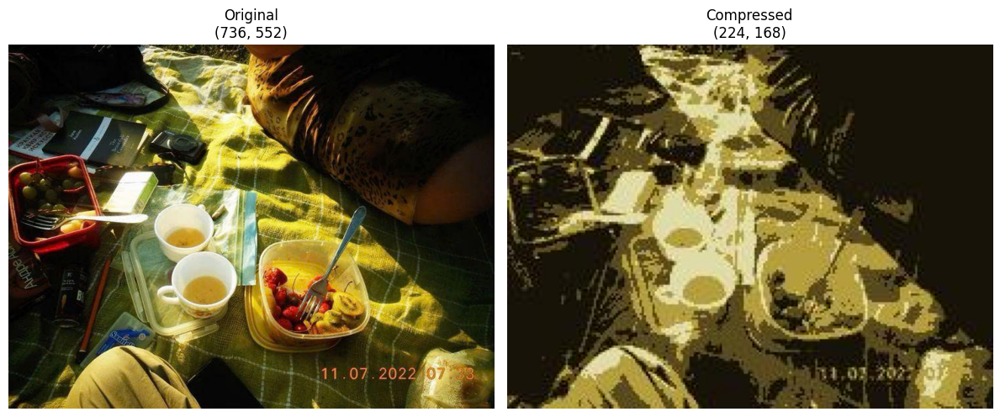

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Ảnh gốc
img_original = Image.open("f95aed8502aa31e208630a20b28c808c.jpg")

# Ảnh nén
img_compressed = Image.open("compressed.jpg")

plt.figure(figsize=(12, 6))

# Ảnh gốc
plt.subplot(1, 2, 1)
plt.imshow(img_original)
plt.title(f"Original\n{img_original.size}")
plt.axis("off")

# Ảnh nén
plt.subplot(1, 2, 2)
plt.imshow(img_compressed)
plt.title(f"Compressed\n{img_compressed.size}")
plt.axis("off")

plt.tight_layout()
plt.show()

K=5

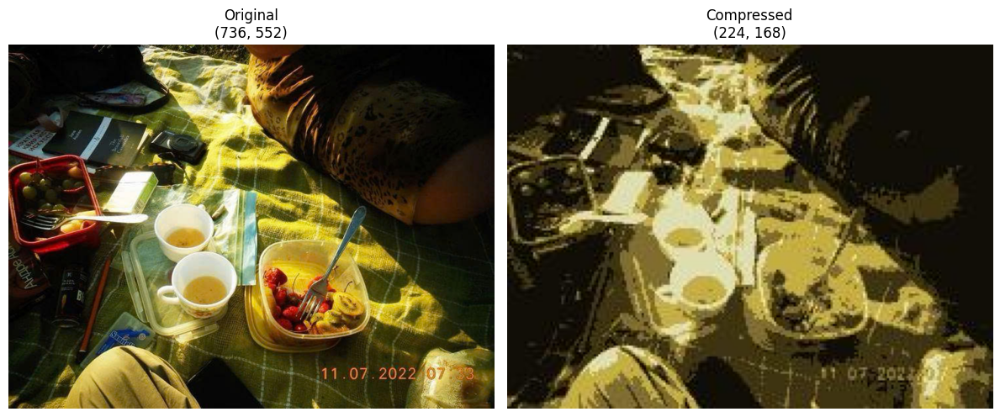

In [66]:
import matplotlib.pyplot as plt
from PIL import Image

# Ảnh gốc
img_original = Image.open("f95aed8502aa31e208630a20b28c808c.jpg")

# Ảnh nén
img_compressed = Image.open("compressed.jpg")

plt.figure(figsize=(12, 6))

# Ảnh gốc
plt.subplot(1, 2, 1)
plt.imshow(img_original)
plt.title(f"Original\n{img_original.size}")
plt.axis("off")

# Ảnh nén
plt.subplot(1, 2, 2)
plt.imshow(img_compressed)
plt.title(f"Compressed\n{img_compressed.size}")
plt.axis("off")

plt.tight_layout()
plt.show()

k=30

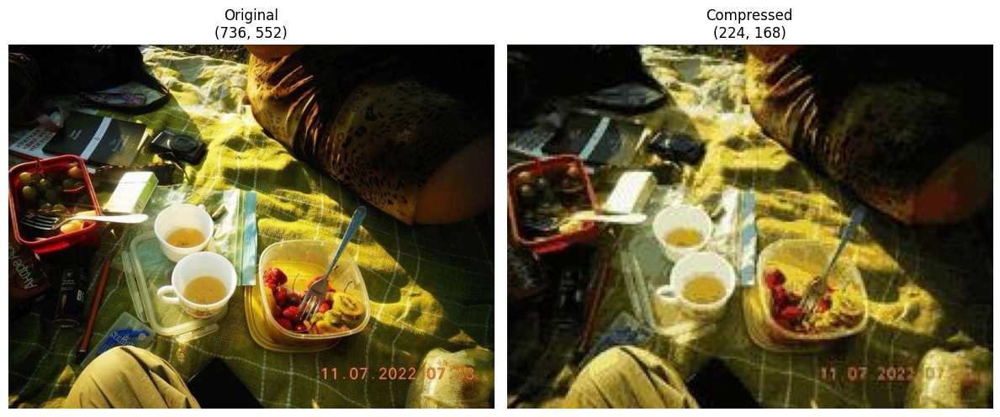

In [24]:
import matplotlib.pyplot as plt
from PIL import Image

# Ảnh gốc
img_original = Image.open("f95aed8502aa31e208630a20b28c808c.jpg")

# Ảnh nén
img_compressed = Image.open("compressed.jpg")

plt.figure(figsize=(12, 6))

# Ảnh gốc
plt.subplot(1, 2, 1)
plt.imshow(img_original)
plt.title(f"Original\n{img_original.size}")
plt.axis("off")

# Ảnh nén
plt.subplot(1, 2, 2)
plt.imshow(img_compressed)
plt.title(f"Compressed\n{img_compressed.size}")
plt.axis("off")

plt.tight_layout()
plt.show()